In [10]:
# importing libraries

import os
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

import cv2
import matplotlib.pyplot as plt

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from tqdm import tqdm

from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from skimage.restoration import denoise_tv_chambolle, denoise_nl_means

import kagglehub

In [11]:
# kaggle dataset and dataset loader

path = kagglehub.dataset_download("rajat95gupta/smartphone-image-denoising-dataset")
data_path = os.path.join(path, "SIDD_Small_sRGB_Only", "Data")


class SIDD_Dataset(Dataset):
    def __init__(self, data_dir, size=(256, 256)):
        self.pairs = []
        for folder in sorted(os.listdir(data_dir)):
            folder_path = os.path.join(data_dir, folder)
            if not os.path.isdir(folder_path):
                continue
            noisy = os.path.join(folder_path, "NOISY_SRGB_010.PNG")
            clean = os.path.join(folder_path, "GT_SRGB_010.PNG")
            if os.path.exists(noisy) and os.path.exists(clean):
                self.pairs.append((noisy, clean))

        self.size = size

    def __len__(self):
        return len(self.pairs)

    def __getitem__(self, idx):
        noisy_path, clean_path = self.pairs[idx]
        noisy = cv2.imread(noisy_path, cv2.IMREAD_COLOR)
        clean = cv2.imread(clean_path, cv2.IMREAD_COLOR)

        noisy = cv2.cvtColor(noisy, cv2.COLOR_BGR2RGB) / 255.0
        clean = cv2.cvtColor(clean, cv2.COLOR_BGR2RGB) / 255.0

        noisy = cv2.resize(noisy, self.size, interpolation=cv2.INTER_AREA)
        clean = cv2.resize(clean, self.size, interpolation=cv2.INTER_AREA)

        noisy = torch.tensor(noisy, dtype=torch.float32).permute(2, 0, 1)
        clean = torch.tensor(clean, dtype=torch.float32).permute(2, 0, 1)
        return noisy, clean

In [12]:
# classical methods

def tv_denoise_single(img, weight=0.5):
    np_img = img.permute(1,2,0).cpu().numpy()
    tv = denoise_tv_chambolle(np_img, weight=weight, channel_axis=-1)
    return torch.tensor(tv, dtype=torch.float32).permute(2,0,1)

def mean_filter_single(img, kernel_size=3):
    pad = kernel_size // 2
    kernel = torch.ones((1,1,kernel_size,kernel_size)) / (kernel_size**2)
    img = img.unsqueeze(0)
    out = torch.cat([F.conv2d(img[:,c:c+1], kernel, padding=pad) for c in range(3)], dim=1)
    return out.squeeze(0)

def bilateral_filter_single(img, d=9, sigmaColor=75, sigmaSpace=75):
    arr = (img.permute(1,2,0).numpy() * 255).astype(np.uint8)
    bf = cv2.bilateralFilter(arr, d, sigmaColor, sigmaSpace) / 255.0
    return torch.tensor(bf, dtype=torch.float32).permute(2,0,1)

def nlm_denoise_single(img, h=0.1, patch_size=5, patch_distance=6):
    np_img = img.permute(1,2,0).numpy()
    nlm = denoise_nl_means(np_img, h=h, patch_size=patch_size,
                           patch_distance=patch_distance, 
                           fast_mode=True, channel_axis=-1)
    return torch.tensor(nlm, dtype=torch.float32).permute(2,0,1)

def kernel_regression_single(img, kernel_size=7, sigma=2.0):
    pad = kernel_size // 2
    ax = np.arange(-pad, pad+1)
    xx, yy = np.meshgrid(ax, ax)
    k = np.exp(-(xx**2 + yy**2) / (2*sigma**2))
    k /= k.sum()
    kernel = torch.tensor(k, dtype=torch.float32).unsqueeze(0).unsqueeze(0)
    img = img.unsqueeze(0)
    out = torch.cat([F.conv2d(img[:,c:c+1], kernel, padding=pad) for c in range(3)], dim=1)
    return out.squeeze(0)


Processing LIGHT image...

PSNR / SSIM Results (LIGHT IMAGE)
TV     PSNR=30.74  SSIM=0.8957
MF     PSNR=30.56  SSIM=0.8389
BF     PSNR=31.51  SSIM=0.9084
NLM    PSNR=31.51  SSIM=0.9112
KR     PSNR=31.10  SSIM=0.8985

Classical methods that passed SSIM > 0.8 test on LIGHT image:
- TV
- MF
- BF
- NLM
- KR


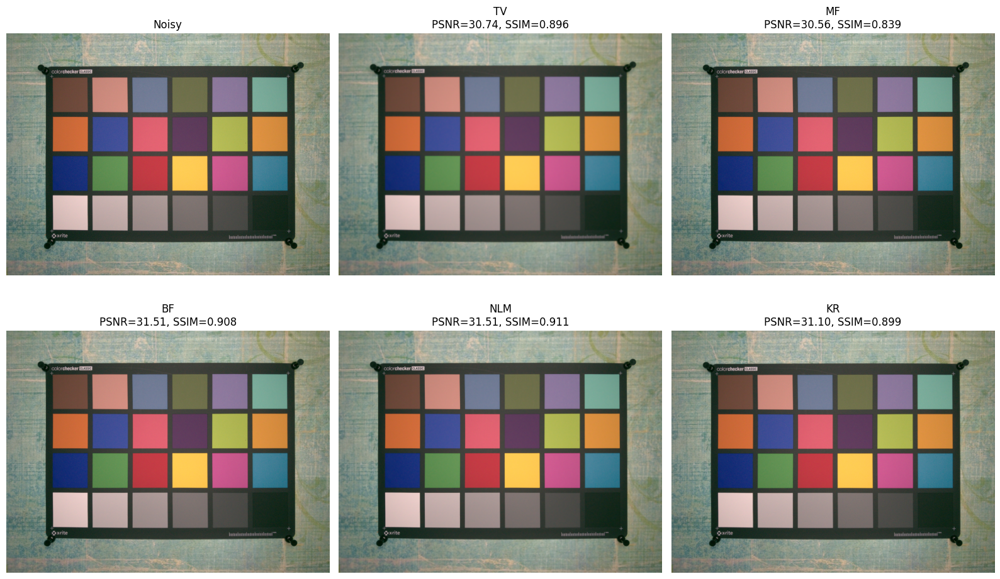


Saved LIGHT image results to classical_light/


In [14]:
# LIGHT IMAGE

light_img_noisy = "/kaggle/input/smartphone-image-denoising-dataset/SIDD_Small_sRGB_Only/Data/0030_001_IP_01600_02000_5500_N/NOISY_SRGB_010.PNG"  
light_img_clean = light_img_noisy.replace("NOISY", "GT")
print("\nProcessing LIGHT image...")

# load
noisy = cv2.cvtColor(cv2.imread(light_img_noisy), cv2.COLOR_BGR2RGB) / 255.0
clean = cv2.cvtColor(cv2.imread(light_img_clean), cv2.COLOR_BGR2RGB) / 255.0
noisy_t = torch.tensor(noisy, dtype=torch.float32).permute(2, 0, 1)

# classical methods
tv_img   = tv_denoise_single(noisy_t).permute(1,2,0).numpy()
mean_img = mean_filter_single(noisy_t).permute(1,2,0).numpy()
bil_img  = bilateral_filter_single(noisy_t).permute(1,2,0).numpy()
nlm_img  = nlm_denoise_single(noisy_t).permute(1,2,0).numpy()
ker_img  = kernel_regression_single(noisy_t).permute(1,2,0).numpy()

# metrics
def compute_metrics(clean, den):
    return psnr(clean, den, data_range=1.0), \
           ssim(clean, den, data_range=1.0, channel_axis=-1)
results_light = {
    "TV":   compute_metrics(clean, tv_img),
    "MF":   compute_metrics(clean, mean_img),
    "BF":   compute_metrics(clean, bil_img),
    "NLM":  compute_metrics(clean, nlm_img),
    "KR":   compute_metrics(clean, ker_img),
}

print("\nPSNR / SSIM Results (LIGHT IMAGE)")
for name, (p, s) in results_light.items():
    print(f"{name:5s}  PSNR={p:.2f}  SSIM={s:.4f}")

# SSIM > 0.8 test
passed_light = [method for method, (_, s) in results_light.items() if s > 0.8]
print("\nClassical methods that passed SSIM > 0.8 test on LIGHT image:")
print("None" if not passed_light else "\n".join(f"- {m}" for m in passed_light))

# visualization
titles = {
    "Noisy": noisy,
    "TV": tv_img,
    "MF": mean_img,
    "BF": bil_img,
    "NLM": nlm_img,
    "KR": ker_img,
}

plt.figure(figsize=(16, 10))
for i, (name, img) in enumerate(titles.items(), 1):
    plt.subplot(2, 3, i)
    if name in results_light:
        p, s = results_light[name]
        plt.title(f"{name}\nPSNR={p:.2f}, SSIM={s:.3f}")
    else:
        plt.title(name)
    plt.imshow(img)
    plt.axis("off")
plt.tight_layout()
plt.show()

# save images
output_folder_light = "classical_light"
os.makedirs(output_folder_light, exist_ok=True)
def save_img(path, img):
    out = (img * 255).clip(0,255).astype(np.uint8)
    cv2.imwrite(path, cv2.cvtColor(out, cv2.COLOR_RGB2BGR))
save_img(f"{output_folder_light}/noisy.png", noisy)
save_img(f"{output_folder_light}/tv.png", tv_img)
save_img(f"{output_folder_light}/mean.png", mean_img)
save_img(f"{output_folder_light}/bf.png", bil_img)
save_img(f"{output_folder_light}/nlm.png", nlm_img)
save_img(f"{output_folder_light}/kr.png", ker_img)

print(f"\nSaved LIGHT image results to {output_folder_light}/")


Processing LOW-LIGHT image...

PSNR / SSIM Results (LOW-LIGHT IMAGE)
TV     PSNR=36.44  SSIM=0.9528
MF     PSNR=31.16  SSIM=0.6937
BF     PSNR=34.87  SSIM=0.8905
NLM    PSNR=36.66  SSIM=0.9479
KR     PSNR=34.48  SSIM=0.8653

Classical methods that passed SSIM > 0.8 test on LOW-LIGHT image:
- TV
- BF
- NLM
- KR


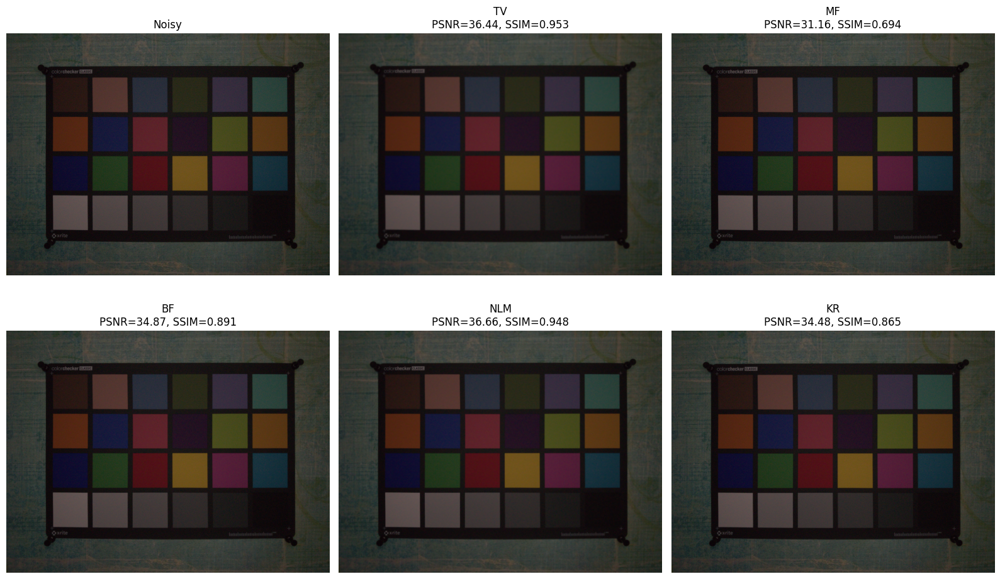


Saved LOW-LIGHT image results to classical_lowlight/


In [16]:
#  LOW-LIGHT IMAGE 

low_img_noisy = "/kaggle/input/smartphone-image-denoising-dataset/SIDD_Small_sRGB_Only/Data/0033_001_IP_00100_00160_3200_N/NOISY_SRGB_010.PNG"   
low_img_clean = low_img_noisy.replace("NOISY", "GT")
print("\nProcessing LOW-LIGHT image...")

# load
noisy = cv2.cvtColor(cv2.imread(low_img_noisy), cv2.COLOR_BGR2RGB) / 255.0
clean = cv2.cvtColor(cv2.imread(low_img_clean), cv2.COLOR_BGR2RGB) / 255.0
noisy_t = torch.tensor(noisy, dtype=torch.float32).permute(2, 0, 1)

# classical methods
tv_img   = tv_denoise_single(noisy_t).permute(1,2,0).numpy()
mean_img = mean_filter_single(noisy_t).permute(1,2,0).numpy()
bil_img  = bilateral_filter_single(noisy_t).permute(1,2,0).numpy()
nlm_img  = nlm_denoise_single(noisy_t).permute(1,2,0).numpy()
ker_img  = kernel_regression_single(noisy_t).permute(1,2,0).numpy()

# metrics
results_low = {
    "TV":   compute_metrics(clean, tv_img),
    "MF":   compute_metrics(clean, mean_img),
    "BF":   compute_metrics(clean, bil_img),
    "NLM":  compute_metrics(clean, nlm_img),
    "KR":   compute_metrics(clean, ker_img),
}

print("\nPSNR / SSIM Results (LOW-LIGHT IMAGE)")
for name, (p, s) in results_low.items():
    print(f"{name:5s}  PSNR={p:.2f}  SSIM={s:.4f}")

# SSIM > 0.8 test
passed_low = [method for method, (_, s) in results_low.items() if s > 0.8]
print("\nClassical methods that passed SSIM > 0.8 test on LOW-LIGHT image:")
print("None" if not passed_low else "\n".join(f"- {m}" for m in passed_low))

# visualization
titles = {
    "Noisy": noisy,
    "TV": tv_img,
    "MF": mean_img,
    "BF": bil_img,
    "NLM": nlm_img,
    "KR": ker_img,
}

plt.figure(figsize=(16, 10))
for i, (name, img) in enumerate(titles.items(), 1):
    plt.subplot(2, 3, i)
    if name in results_low:
        p, s = results_low[name]
        plt.title(f"{name}\nPSNR={p:.2f}, SSIM={s:.3f}")
    else:
        plt.title(name)
    plt.imshow(img)
    plt.axis("off")
plt.tight_layout()
plt.show()

# save images
output_folder_low = "classical_lowlight"
os.makedirs(output_folder_low, exist_ok=True)
save_img(f"{output_folder_low}/noisy.png", noisy)
save_img(f"{output_folder_low}/tv.png", tv_img)
save_img(f"{output_folder_low}/mean.png", mean_img)
save_img(f"{output_folder_low}/bf.png", bil_img)
save_img(f"{output_folder_low}/nlm.png", nlm_img)
save_img(f"{output_folder_low}/kr.png", ker_img)

print(f"\nSaved LOW-LIGHT image results to {output_folder_low}/")

In [17]:
# attention definition
class AttentionBlock(nn.Module):
    def __init__(self, F_g, F_l, F_int):
        super().__init__()
        self.W_g = nn.Sequential(nn.Conv2d(F_g, F_int, 1),
                                 nn.BatchNorm2d(F_int))
        self.W_x = nn.Sequential(nn.Conv2d(F_l, F_int, 1),
                                 nn.BatchNorm2d(F_int))
        self.psi = nn.Sequential(nn.Conv2d(F_int, 1, 1),
                                 nn.BatchNorm2d(1),
                                 nn.Sigmoid())
        self.relu = nn.ReLU(inplace=True)

    def forward(self, g, x):
        g1 = self.W_g(g)
        x1 = self.W_x(x)
        if g1.shape[2:] != x1.shape[2:]:
            g1 = F.interpolate(g1, size=x1.shape[2:], mode='bilinear', align_corners=False)
        psi = self.psi(self.relu(g1 + x1))
        return x * psi

# u-net definition
class UNet(nn.Module):
    def __init__(self):
        super().__init__()

        def block(i,o):
            return nn.Sequential(nn.Conv2d(i,o,3,padding=1),
                                 nn.BatchNorm2d(o),
                                 nn.ReLU(inplace=True))

        self.enc1 = block(3,64)
        self.enc2 = block(64,128)
        self.enc3 = block(128,256)

        self.pool = nn.MaxPool2d(2)

        self.bottleneck = block(256,512)

        self.up3 = nn.ConvTranspose2d(512,256,2,stride=2)
        self.att3 = AttentionBlock(256,256,128)
        self.dec3 = block(512,256)

        self.up2 = nn.ConvTranspose2d(256,128,2,stride=2)
        self.att2 = AttentionBlock(128,128,64)
        self.dec2 = block(256,128)

        self.up1 = nn.ConvTranspose2d(128,64,2,stride=2)
        self.dec1 = block(128,64)

        self.final = nn.Conv2d(64,3,1)

    def forward(self, x):
        x1 = self.enc1(x)
        x2 = self.enc2(self.pool(x1))
        x3 = self.enc3(self.pool(x2))
        x4 = self.bottleneck(self.pool(x3))

        d3 = self.up3(x4)
        d3 = F.interpolate(d3, size=x3.shape[2:], mode='bilinear', align_corners=False)
        d3 = self.dec3(torch.cat([d3, self.att3(d3, x3)], dim=1))

        d2 = self.up2(d3)
        d2 = F.interpolate(d2, size=x2.shape[2:], mode='bilinear', align_corners=False)
        d2 = self.dec2(torch.cat([d2, self.att2(d2, x2)], dim=1))

        d1 = self.up1(d2)
        d1 = F.interpolate(d1, size=x1.shape[2:], mode='bilinear', align_corners=False)
        d1 = self.dec1(torch.cat([d1, x1], dim=1))

        return torch.sigmoid(self.final(d1))

In [18]:
# training function
def train_model(model, loader, epochs, lr=1e-4, device='cuda'):
    model.to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = nn.MSELoss()
    for epoch in range(epochs):
        model.train()
        total_loss = 0
        for noisy, clean in tqdm(loader, desc=f"Epoch {epoch+1}/{epochs}"):
            noisy, clean = noisy.to(device).float(), clean.to(device).float()
            optimizer.zero_grad()
            pred = model(noisy)
            loss = criterion(pred, clean)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
        print(f"Epoch {epoch+1} | Loss: {total_loss/len(loader):.5f}")


# evaluation function
def evaluate(model, loader, device='cuda'):
    model.eval()
    psnr_vals, ssim_vals = [], []
    with torch.no_grad():
        for noisy, clean in loader:
            noisy, clean = noisy.to(device).float(), clean.to(device).float()
            pred = model(noisy).clamp(0, 1)
            # convert first image in batch to numpy
            pred_np = pred[0].permute(1, 2, 0).cpu().numpy()
            clean_np = clean[0].permute(1, 2, 0).cpu().numpy()
            # compute metrics (normalize range to 0–1)
            psnr_vals.append(psnr(clean_np, pred_np, data_range=1.0))
            ssim_vals.append(ssim(clean_np, pred_np, data_range=1.0, channel_axis=-1))
    print(f"PSNR ON TRAIN IMAGES: {np.mean(psnr_vals):.2f}, SSIM ON TRAIN IMAGES: {np.mean(ssim_vals):.4f}")

In [8]:
# function to run experiment
def run_experiment(epochs, loader, light_path, lowlight_path):

    print(f"\n============== TRAINING FOR {epochs} EPOCHS ==============\n")

    model = UNet()
    train_model(model, loader, epochs)

    device = "cuda" if torch.cuda.is_available() else "cpu"

    # light image
    print("\nLIGHT IMAGE RESULTS:")
    for _ in tqdm(range(1), desc="Evaluating light image"):
        P, S, noisy, den, clean, passed = evaluate_unet(
            model,
            light_path,
            f"unet_{epochs}_light",
            device=device
        )

    print(f"Epochs that passed SSIM > 0.8 test on light image: {epochs if S>0.8 else 'none'}")

    save_images(noisy, den, clean, f"unet_{epochs}_light")
    visualize(
        noisy, den, clean,
        f"U-Net {epochs} epochs\nPSNR={P:.2f}, SSIM={S:.3f}"
    )

    # low-light image
    print("\nLOW-LIGHT IMAGE RESULTS:")
    for _ in tqdm(range(1), desc="Evaluating low-light image"):
        P2, S2, noisy2, den2, clean2, passed2 = evaluate_unet(
            model,
            lowlight_path,
            f"unet_{epochs}_lowlight",
            device=device
        )

    print(f"Epochs that passed SSIM > 0.8 test on low-light image: {epochs if S2>0.8 else 'none'}")

    save_images(noisy2, den2, clean2, f"unet_{epochs}_lowlight")
    visualize(
        noisy2, den2, clean2,
        f"U-Net {epochs} epochs\nPSNR={P2:.2f}, SSIM={S2:.3f}"
    )

    return model

Epoch 1/5: 100%|██████████| 80/80 [03:02<00:00,  2.28s/it]


Epoch 1 | Loss: 0.04261


Epoch 2/5: 100%|██████████| 80/80 [03:06<00:00,  2.33s/it]


Epoch 2 | Loss: 0.02590


Epoch 3/5: 100%|██████████| 80/80 [03:02<00:00,  2.28s/it]


Epoch 3 | Loss: 0.02047


Epoch 4/5: 100%|██████████| 80/80 [03:03<00:00,  2.29s/it]


Epoch 4 | Loss: 0.01777


Epoch 5/5: 100%|██████████| 80/80 [03:04<00:00,  2.30s/it]


Epoch 5 | Loss: 0.01422
PSNR ON TRAIN IMAGES: 27.99, SSIM ON TRAIN IMAGES: 0.8541


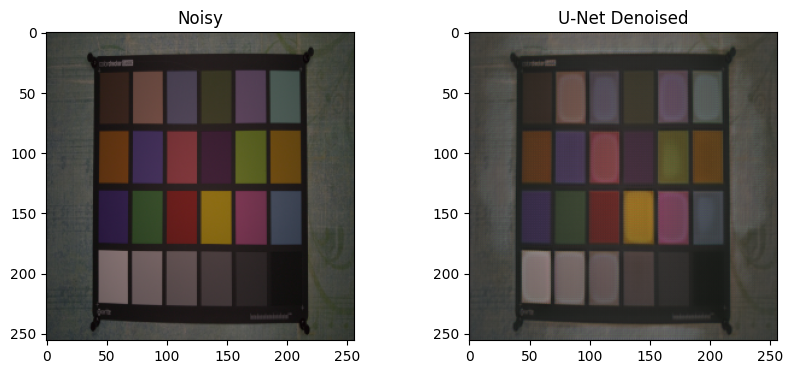

In [20]:
# main execution for 5 epochs
if __name__ == "__main__":
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Resize((256, 256))
    ])
    dataset = SIDD_Dataset(data_path)
    loader = DataLoader(dataset, batch_size=2, shuffle=True)

    noisy_imgs, clean_imgs = next(iter(loader))

    model5 = UNet()
    train_model(model5, loader, epochs=5, lr=1e-4)
    evaluate(model5, loader)

    # visualization 
    with torch.no_grad():
        pred = model5(noisy_imgs.to('cuda')).cpu()
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(noisy_imgs[0].permute(1, 2, 0))
    plt.title("Noisy")
    plt.subplot(1, 2, 2)
    plt.imshow(pred[0].permute(1, 2, 0).clamp(0,1))
    plt.title("U-Net Denoised")
    plt.show()

PSNR (5 epochs, light image): 26.20
SSIM (5 epochs, light image): 0.7596
Attention U-Net 5 epochs FAILED the SSIM > 0.8 test on LIGHT image.


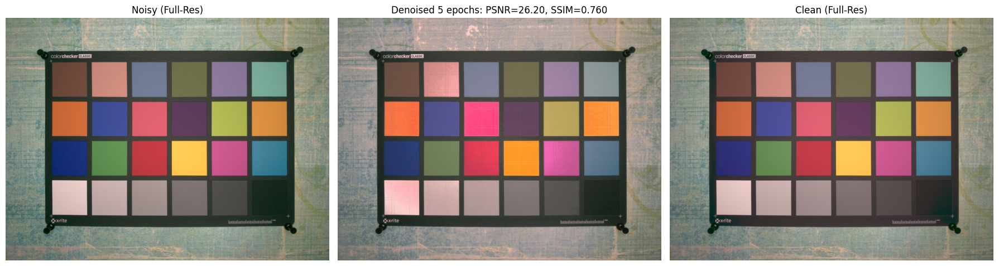


Saved full-resolution denoised image as unet5_light.png


In [25]:
# LIGHT IMAGE TEST 5 EPOCHS

# load full-res
noisy_full = cv2.cvtColor(cv2.imread(light_img_noisy), cv2.COLOR_BGR2RGB) / 255.0
clean_full = cv2.cvtColor(cv2.imread(light_img_clean), cv2.COLOR_BGR2RGB) / 255.0
H, W, _ = noisy_full.shape
patch = 256
overlap = 32
device = "cuda" if torch.cuda.is_available() else "cpu"
model5 = model5.to(device)
model5.eval()

# output accumulators
output = np.zeros((H, W, 3), dtype=np.float32)
weight = np.zeros((H, W, 1), dtype=np.float32)

# sliding window
with torch.no_grad():
    for y in range(0, H, patch - overlap):
        for x in range(0, W, patch - overlap):
            y2 = min(y + patch, H)
            x2 = min(x + patch, W)
            tile = noisy_full[y:y2, x:x2]
            # pad to 256×256
            padded = np.zeros((patch, patch, 3), dtype=np.float32)
            padded[:y2 - y, :x2 - x] = tile
            tile_t = torch.tensor(padded, dtype=torch.float32).permute(2,0,1).unsqueeze(0).to(device)
            pred = model5(tile_t).clamp(0,1).cpu().squeeze(0).permute(1,2,0).numpy()
            pred = pred[:y2 - y, :x2 - x]
            output[y:y2, x:x2] += pred
            weight[y:y2, x:x2] += 1

# normalize overlapping regions
den_full = output / weight

# metrics
ps_full = psnr(clean_full, den_full, data_range=1.0)
ss_full = ssim(clean_full, den_full, data_range=1.0, channel_axis=-1)
print(f"PSNR (5 epochs, light image): {ps_full:.2f}")
print(f"SSIM (5 epochs, light image): {ss_full:.4f}")
if ss_full > 0.8:
    print("Attention U-Net 5 epochs PASSED the SSIM > 0.8 test on LIGHT image.")
else:
    print("Attention U-Net 5 epochs FAILED the SSIM > 0.8 test on LIGHT image.")

# visualization
plt.figure(figsize=(18,6))
plt.subplot(1,3,1)
plt.imshow(noisy_full)
plt.title("Noisy (Full-Res)")
plt.axis("off")
plt.subplot(1,3,2)
plt.imshow(den_full)
plt.title(f"Denoised 5 epochs: PSNR={ps_full:.2f}, SSIM={ss_full:.3f}")
plt.axis("off")
plt.subplot(1,3,3)
plt.imshow(clean_full)
plt.title("Clean (Full-Res)")
plt.axis("off")
plt.tight_layout()
plt.show()

# saving
cv2.imwrite("unet5_light.png", cv2.cvtColor((den_full * 255).astype(np.uint8), cv2.COLOR_RGB2BGR))
print("\nSaved full-resolution denoised image as unet5_light.png")

PSNR (5 epochs, low-light image): 30.06
SSIM (5 epochs, low-light image): 0.7059
Attention U-Net 5 epochs FAILED the SSIM > 0.8 test on LOW-LIGHT image.


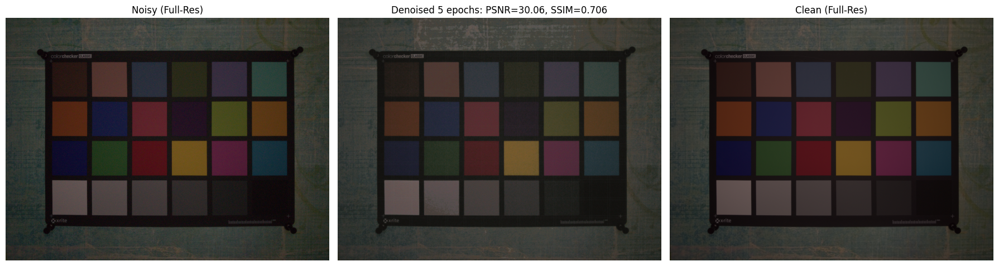


Saved full-resolution denoised image as unet5_lowlight.png


In [26]:
# LOW-LIGHT IMAGE TEST 5 EPOCHS

# load full-res
noisy_full = cv2.cvtColor(cv2.imread(low_img_noisy), cv2.COLOR_BGR2RGB) / 255.0
clean_full = cv2.cvtColor(cv2.imread(low_img_clean), cv2.COLOR_BGR2RGB) / 255.0
H, W, _ = noisy_full.shape
patch = 256
overlap = 32
device = "cuda" if torch.cuda.is_available() else "cpu"
model5 = model5.to(device)
model5.eval()

# output accumulators
output = np.zeros((H, W, 3), dtype=np.float32)
weight = np.zeros((H, W, 1), dtype=np.float32)

# sliding window
with torch.no_grad():
    for y in range(0, H, patch - overlap):
        for x in range(0, W, patch - overlap):
            y2 = min(y + patch, H)
            x2 = min(x + patch, W)
            tile = noisy_full[y:y2, x:x2]
            # pad to 256×256
            padded = np.zeros((patch, patch, 3), dtype=np.float32)
            padded[:y2 - y, :x2 - x] = tile
            tile_t = torch.tensor(padded, dtype=torch.float32).permute(2,0,1).unsqueeze(0).to(device)
            pred = model5(tile_t).clamp(0,1).cpu().squeeze(0).permute(1,2,0).numpy()
            pred = pred[:y2 - y, :x2 - x]
            output[y:y2, x:x2] += pred
            weight[y:y2, x:x2] += 1

# normalize overlapping regions
den_full = output / weight

# metrics
ps_full = psnr(clean_full, den_full, data_range=1.0)
ss_full = ssim(clean_full, den_full, data_range=1.0, channel_axis=-1)
print(f"PSNR (5 epochs, low-light image): {ps_full:.2f}")
print(f"SSIM (5 epochs, low-light image): {ss_full:.4f}")
if ss_full > 0.8:
    print("Attention U-Net 5 epochs PASSED the SSIM > 0.8 test on LOW-LIGHT image.")
else:
    print("Attention U-Net 5 epochs FAILED the SSIM > 0.8 test on LOW-LIGHT image.")

# visualization
plt.figure(figsize=(18,6))
plt.subplot(1,3,1)
plt.imshow(noisy_full)
plt.title("Noisy (Full-Res)")
plt.axis("off")
plt.subplot(1,3,2)
plt.imshow(den_full)
plt.title(f"Denoised 5 epochs: PSNR={ps_full:.2f}, SSIM={ss_full:.3f}")
plt.axis("off")
plt.subplot(1,3,3)
plt.imshow(clean_full)
plt.title("Clean (Full-Res)")
plt.axis("off")
plt.tight_layout()
plt.show()

# saving
cv2.imwrite("unet5_lowlight.png", cv2.cvtColor((den_full * 255).astype(np.uint8), cv2.COLOR_RGB2BGR))
print("\nSaved full-resolution denoised image as unet5_lowlight.png")

Epoch 1/10: 100%|██████████| 80/80 [03:01<00:00,  2.27s/it]


Epoch 1 | Loss: 0.04947


Epoch 2/10: 100%|██████████| 80/80 [03:02<00:00,  2.28s/it]


Epoch 2 | Loss: 0.03256


Epoch 3/10: 100%|██████████| 80/80 [03:01<00:00,  2.27s/it]


Epoch 3 | Loss: 0.02506


Epoch 4/10: 100%|██████████| 80/80 [03:02<00:00,  2.28s/it]


Epoch 4 | Loss: 0.02167


Epoch 5/10: 100%|██████████| 80/80 [03:02<00:00,  2.28s/it]


Epoch 5 | Loss: 0.01690


Epoch 6/10: 100%|██████████| 80/80 [03:01<00:00,  2.27s/it]


Epoch 6 | Loss: 0.01764


Epoch 7/10: 100%|██████████| 80/80 [03:01<00:00,  2.27s/it]


Epoch 7 | Loss: 0.01685


Epoch 8/10: 100%|██████████| 80/80 [03:01<00:00,  2.27s/it]


Epoch 8 | Loss: 0.01531


Epoch 9/10: 100%|██████████| 80/80 [03:02<00:00,  2.28s/it]


Epoch 9 | Loss: 0.01400


Epoch 10/10: 100%|██████████| 80/80 [03:02<00:00,  2.28s/it]


Epoch 10 | Loss: 0.01260
PSNR ON TRAIN IMAGES: 28.07, SSIM ON TRAIN IMAGES: 0.8717


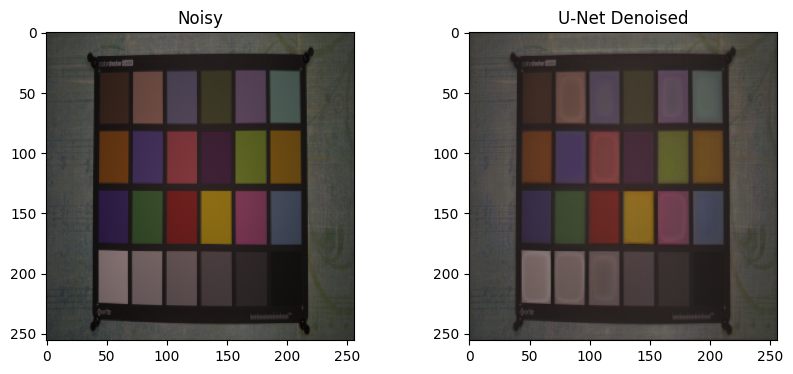

In [27]:
# main execution for 10 epochs
if __name__ == "__main__":
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Resize((256, 256))
    ])
    dataset = SIDD_Dataset(data_path)
    loader = DataLoader(dataset, batch_size=2, shuffle=True)

    noisy_imgs, clean_imgs = next(iter(loader))

    model10 = UNet()
    train_model(model10, loader, epochs=10, lr=1e-4)
    evaluate(model10, loader)

    # visualization 
    with torch.no_grad():
        pred = model10(noisy_imgs.to('cuda')).cpu()
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(noisy_imgs[0].permute(1, 2, 0))
    plt.title("Noisy")
    plt.subplot(1, 2, 2)
    plt.imshow(pred[0].permute(1, 2, 0).clamp(0,1))
    plt.title("U-Net Denoised")
    plt.show()

PSNR (10 epochs, light image): 25.62
SSIM (10 epochs, light image): 0.7386
Attention U-Net 10 epochs FAILED the SSIM > 0.8 test on LIGHT image.


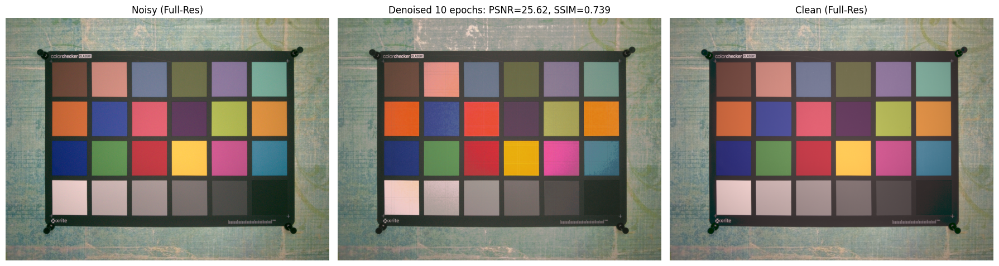


Saved full-resolution denoised image as unet10_light.png


In [28]:
# LIGHT IMAGE TEST 10 EPOCHS

# load full-res
noisy_full = cv2.cvtColor(cv2.imread(light_img_noisy), cv2.COLOR_BGR2RGB) / 255.0
clean_full = cv2.cvtColor(cv2.imread(light_img_clean), cv2.COLOR_BGR2RGB) / 255.0
H, W, _ = noisy_full.shape
patch = 256
overlap = 32
device = "cuda" if torch.cuda.is_available() else "cpu"
model0 = model10.to(device)
model10.eval()

# output accumulators
output = np.zeros((H, W, 3), dtype=np.float32)
weight = np.zeros((H, W, 1), dtype=np.float32)

# sliding window
with torch.no_grad():
    for y in range(0, H, patch - overlap):
        for x in range(0, W, patch - overlap):
            y2 = min(y + patch, H)
            x2 = min(x + patch, W)
            tile = noisy_full[y:y2, x:x2]
            # pad to 256×256
            padded = np.zeros((patch, patch, 3), dtype=np.float32)
            padded[:y2 - y, :x2 - x] = tile
            tile_t = torch.tensor(padded, dtype=torch.float32).permute(2,0,1).unsqueeze(0).to(device)
            pred = model10(tile_t).clamp(0,1).cpu().squeeze(0).permute(1,2,0).numpy()
            pred = pred[:y2 - y, :x2 - x]
            output[y:y2, x:x2] += pred
            weight[y:y2, x:x2] += 1

# normalize overlapping regions
den_full = output / weight

# metrics
ps_full = psnr(clean_full, den_full, data_range=1.0)
ss_full = ssim(clean_full, den_full, data_range=1.0, channel_axis=-1)
print(f"PSNR (10 epochs, light image): {ps_full:.2f}")
print(f"SSIM (10 epochs, light image): {ss_full:.4f}")
if ss_full > 0.8:
    print("Attention U-Net 10 epochs PASSED the SSIM > 0.8 test on LIGHT image.")
else:
    print("Attention U-Net 10 epochs FAILED the SSIM > 0.8 test on LIGHT image.")

# visualization
plt.figure(figsize=(18,6))
plt.subplot(1,3,1)
plt.imshow(noisy_full)
plt.title("Noisy (Full-Res)")
plt.axis("off")
plt.subplot(1,3,2)
plt.imshow(den_full)
plt.title(f"Denoised 10 epochs: PSNR={ps_full:.2f}, SSIM={ss_full:.3f}")
plt.axis("off")
plt.subplot(1,3,3)
plt.imshow(clean_full)
plt.title("Clean (Full-Res)")
plt.axis("off")
plt.tight_layout()
plt.show()

# saving
cv2.imwrite("unet10_light.png", cv2.cvtColor((den_full * 255).astype(np.uint8), cv2.COLOR_RGB2BGR))
print("\nSaved full-resolution denoised image as unet10_light.png")

PSNR (10 epochs, low-light image): 28.36
SSIM (10 epochs, low-light image): 0.6460
Attention U-Net 10 epochs FAILED the SSIM > 0.8 test on LOW-LIGHT image.


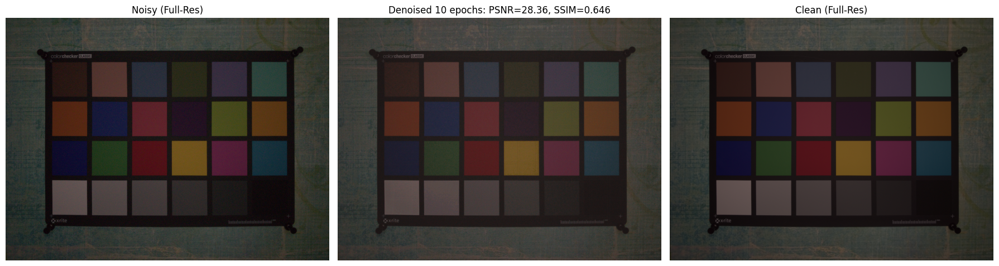


Saved full-resolution denoised image as unet10_lowlight.png


In [29]:
# LOW-LIGHT IMAGE TEST 10 EPOCHS

# load full-res
noisy_full = cv2.cvtColor(cv2.imread(low_img_noisy), cv2.COLOR_BGR2RGB) / 255.0
clean_full = cv2.cvtColor(cv2.imread(low_img_clean), cv2.COLOR_BGR2RGB) / 255.0
H, W, _ = noisy_full.shape
patch = 256
overlap = 32
device = "cuda" if torch.cuda.is_available() else "cpu"
model10 = model10.to(device)
model10.eval()

# output accumulators
output = np.zeros((H, W, 3), dtype=np.float32)
weight = np.zeros((H, W, 1), dtype=np.float32)

# sliding window
with torch.no_grad():
    for y in range(0, H, patch - overlap):
        for x in range(0, W, patch - overlap):
            y2 = min(y + patch, H)
            x2 = min(x + patch, W)
            tile = noisy_full[y:y2, x:x2]
            # pad to 256×256
            padded = np.zeros((patch, patch, 3), dtype=np.float32)
            padded[:y2 - y, :x2 - x] = tile
            tile_t = torch.tensor(padded, dtype=torch.float32).permute(2,0,1).unsqueeze(0).to(device)
            pred = model10(tile_t).clamp(0,1).cpu().squeeze(0).permute(1,2,0).numpy()
            pred = pred[:y2 - y, :x2 - x]
            output[y:y2, x:x2] += pred
            weight[y:y2, x:x2] += 1

# normalize overlapping regions
den_full = output / weight

# metrics
ps_full = psnr(clean_full, den_full, data_range=1.0)
ss_full = ssim(clean_full, den_full, data_range=1.0, channel_axis=-1)
print(f"PSNR (10 epochs, low-light image): {ps_full:.2f}")
print(f"SSIM (10 epochs, low-light image): {ss_full:.4f}")
if ss_full > 0.8:
    print("Attention U-Net 10 epochs PASSED the SSIM > 0.8 test on LOW-LIGHT image.")
else:
    print("Attention U-Net 10 epochs FAILED the SSIM > 0.8 test on LOW-LIGHT image.")

# visualization
plt.figure(figsize=(18,6))
plt.subplot(1,3,1)
plt.imshow(noisy_full)
plt.title("Noisy (Full-Res)")
plt.axis("off")
plt.subplot(1,3,2)
plt.imshow(den_full)
plt.title(f"Denoised 10 epochs: PSNR={ps_full:.2f}, SSIM={ss_full:.3f}")
plt.axis("off")
plt.subplot(1,3,3)
plt.imshow(clean_full)
plt.title("Clean (Full-Res)")
plt.axis("off")
plt.tight_layout()
plt.show()

# saving
cv2.imwrite("unet10_lowlight.png", cv2.cvtColor((den_full * 255).astype(np.uint8), cv2.COLOR_RGB2BGR))
print("\nSaved full-resolution denoised image as unet10_lowlight.png")